# Introduction

The evolution of the magnetic field is governed by the induction equation. In the MHD approximation, it can be written as

\begin{equation}
\frac{\partial \bf B}{\partial t} = \nabla \times \left( \bf v \times B \right)\,,
\end{equation}

where ${\bf v}$ is the velocity of the fluid and ${\bf B}$ is the magnetic field. The velocity evolution is coupled that of the magnetic field via the Lorentz force ($\propto \nabla\times {{\bf B} \times {\bf B}}$). For simplicity, assume that ${\bf B}$ does not affect ${\bf v}$, so we can prescribe ${\bf v}$ externally. This is usually called the "kinematic" regime, where the momentum equation is solved decoupled from the induction equation (or just provides an external velocity field). Note that even in this regime, ${\bf v}$ is, in general, a function of time and the three spatial coordinates.

Induction equation is not a conservative equation. To illustrate this, let us expand the R.H.S. of the induction equation:

\begin{equation}
\nabla \times \left( \bf v \times B \right) = {\bf v} \left( \nabla \cdot {\bf B} \right) - {\bf B} \left( \nabla \cdot {\bf v} \right) + \left({\bf B} \cdot \nabla\right) {\bf v} -   \left({\bf v} \cdot \nabla\right) {\bf B}   \,.\
\end{equation}

Since $\nabla \cdot B = 0$, the first term vanishes. Thus, the induction equation reads

\begin{equation}
\frac{D{\bf B}}{Dt} = \frac{\partial \bf B}{\partial t} + \left({\bf v} \cdot \nabla\right) {\bf B} = \left({\bf B} \cdot \nabla\right) {\bf v} - {\bf B} \left( \nabla \cdot {\bf v} \right)\,, 
\end{equation}

where $D/Dt = \partial_t + {\bf v}\cdot \nabla$ is the material derivative. 

As written above, the induction equation implies that the magnetic field is not conserved along fluid lines. It is not conserved because of source terms related to compression ($\nabla . {\bf v}\neq 0$) and velocity gradients along the magnetic field ($\left({\bf B}\cdot \nabla\right) {\bf v}$). This last term, when coupled to the Lorentz force leads to Alfvén waves.

Also, an update of the magnetic field must satisfy the solenoidal condition. This condition is clearly met analytically, but developing a numerical solver that does conserve $\nabla\cdot B$ imposes additional complications. 

The form of the induction equation combined with (i) the solenoidal constraint and (ii) a new family of waves that appear when coupling it with the momentum equation, makes it a challenging problem. 
However, some insight can be obtained by studying particular configurations where the induction gets simple.


-------
# Advection of magnetic fields

# Case 1 - ${\bf B} = B {\bf e}_z$ and ${\bf v} = v_x {\bf e}_x + v_y {\bf e}_y$ in a 2D sheet ($\partial_z = 0$)

- Assumptions: Let us consider a velocity field orthogonal to the magnetic field. Without loss of generality, we rotate the frame of reference such that ${\bf B} = B_z(x,y) {\bf e}_z$ and ${\bf v} = v_x(x,y) {\bf e}_x + v_y(x,y) {\bf e}_y$.


- Induction equation: Under the assumptions above, the term ${\bf v\cdot \nabla {\bf B}}$ vanishes, and the induction equation becomes

\begin{equation}
\frac{\partial B_z}{\partial t} + {\bf v} \cdot \nabla{B_z} = - {B_z} \nabla \cdot {\bf v}\,,
\end{equation}

which can be written in conservative form:

\begin{equation}
\frac{\partial B_z}{\partial t} + \nabla \cdot \left( B_z {\bf v}\right) = 0\,.
\end{equation}

So, the magnetic field is passively advected by the velocity field. It behaves as the density in the continuity equation, so it can be solved using the solvers you already know.


- Solenoidal constraint: For any given time, the magnetic field is of the form:

\begin{equation}
{\bf B}(x,y,t) = B_z(x,y,t) {\bf e}_z, 
\end{equation}

so, its divergence is:

\begin{equation}
\nabla \cdot {\bf B} = \partial_z \left( {B_z}(x,y,t)\right) = 0\,,
\end{equation}

which is a property independent of the method used to update the field.

### Task 1:

#### Implement an advection scheme (1D or 2D) and advect a magnetic field perpendicular to a given velocity field.

In [50]:
import numpy as np
import matplotlib.pyplot as plt
from time import time
from IPython.display import HTML
from matplotlib import animation

In [51]:
# Empty class, used to create ad hoc objects
class empty_class(): pass

#We reuse a modifiied hd class from last weed
class hd():
    """ Template class for hydrodynamics, with parameters, variables and methods """
    def __init__(self,velocity_field, n=64 ,Lbox=2.):
        """ Initialization of arrays for conservative variables """
        self.n=n                        # number of points along a coordinate axis. n*n in total
        self.Lbox=Lbox                  # box size
        self.t = 0                      # time
        self.it = 0                     # iterations
        self.coordinates()              # setup cooridnate system
        self.velocity = velocity_field  # (2,n,n) array
        self.Bz = np.zeros((n,n))       # (n,n) array
    
    def coordinates(self):
        """ Coordinate initialization """
        n = self.n                      # shorthand, used a lot below
        self.ds = self.Lbox/n

        # cell-centered coordinates are in the interval [-Lbox/2+ds/2,...,Lbox/2-ds/2]
        self.x = np.linspace(-self.Lbox*0.5,self.Lbox*0.5,num=self.n,endpoint=False)+0.5*self.ds
        self.y = self.x
        xv, yv = np.meshgrid(self.x, self.y, sparse=True) # Coordinates as 2D arrays
        self.r = (xv**2 + yv**2)**0.5                     # make a 2D radius function for convenience
    
    def Courant(self,Cdt=0.5):
        """ Courant condition for HD """
        v = self.velocity
        speed = np.sqrt(v[0]**2 + v[1]**2)
        return Cdt*self.ds/np.max(speed)

In [52]:
#Re-using a modified hydro-flux function from last week
def Hydro_Flux(q):
    F = empty_class()
    F.Bz = q.Bz * q.vperp
    return F

In [54]:
#Re-using a modified HLL function from last week
def HLL(ql,qr):
    # maximum wave speeds to the left and right (guaranteed to have correct sign)
    SL = np.minimum(np.minimum(ql.vperp,qr.vperp),0) # <= 0.
    SR = np.maximum(np.maximum(ql.vperp,qr.vperp),0) # >= 0.

    # Hydro fluxes
    Fl = Hydro_Flux(ql)
    Fr = Hydro_Flux(qr)
    
    # HLL flux based on wavespeeds. If SL < 0 and SR > 0 then mix state appropriately
    Flux = empty_class()
    Flux.Bz = (SR*Fl.Bz - SL*Fr.Bz + SL*SR*(qr.Bz - ql.Bz)) / (SR - SL)
    return Flux

In [5]:
#Re-using ... (I think you kinda get the gist now)
def left_slope(f,axis=0):
    return (f-np.roll(f,1,axis))

def MonCen(f):
    """ Monotonized central slope limiter """
    shape=np.insert(f.shape,0,f.ndim)
    slopes=np.empty(shape)
    for i in range(f.ndim):
        ls=left_slope(f,axis=i)
        rs=np.roll(ls,-1,axis=i)
        cs=np.zeros_like(f)
        w=ls*rs>0
        cs[w]=2*ls[w]*rs[w]/(ls[w]+rs[w])
        slopes[i]=cs
    if f.ndim==1:
        return cs
    else:
        return slopes

In [55]:
def muscl_2d (exp, dt, Slope=MonCen, Riemann_Solver=HLL):
    
    # Making shorthand variables
    ds   = exp.ds
    ids  = 1. / exp.ds
    dtds = dt/exp.ds

    # Copying as to not fuck anything up
    Bz = np.copy(exp.Bz)
    v  = exp.velocity.copy()

    # 2) Compute slope limited derivatives based on centered points
    dBz = Slope(Bz) * ids       # returns (2,n,n)
    dv0 = Slope(v[0]) * ids     # returns (2,n,n)
    dv1 = Slope(v[1]) * ids     # returns (2,n,n)
    dv  = np.array([dv0,dv1])   # shape = (2,2,n,n)

    # 3) Trace forward to find solution at [t+dt/2, x +- dx/2]
    # Time evolution with source terms
    div = dv[0,0] + dv[1,1]                               # div(v)
    Bz_t = - v[0] * Bz[0] - v[1] * Bz[1] - Bz*div
    
    # Loop over X- and Y-direction
    for axis in range(2):
        ql = empty_class()
        qr = empty_class()
        
        # Calculates the perpendicular and parallel velocities to the interface
        # X-axis: iperp=0, ipar=1, Y-axis: iperp=1, ipar=0
        iperp = axis
        
        # Perpendicular and parallel velocities
        vperp = v[iperp]

        # 4) Spatial interpolation "axis"-direction + time terms

        # left state -- AS SEEN FROM THE INTERFACE
        ql.Bz = Bz + 0.5*(dt*Bz_t + ds*dBz[axis])
        ql.vperp = vperp #+ 0.5*(ds*dvperp[axis])


        # right state -- AS SEEN FROM THE INTERFACE
        qr.Bz = Bz + 0.5*(dt*Bz_t - ds*dBz[axis])
        qr.vperp = vperp #- 0.5*(ds*dvperp[axis])

        # 5) Roll down -1 in the "axis" direction so that we collect
        qr.Bz = np.roll(qr.Bz,-1,axis=axis)
        qr.vperp = np.roll(qr.vperp,-1,axis=axis)

        # 6) Solve for flux based on interface values
        Flux = Riemann_Solver(ql,qr)

        # 7) Update conserved variables with fluxes
        exp.Bz  -= dtds * (Flux.Bz - np.roll(Flux.Bz,1,axis=axis))

    exp.t  += dt # update time
    exp.it += 1  # update number of iterations

    return exp

In [7]:
# Plotting function 
def imshow(f,size=10,axis=None):
    plt.figure(figsize=(size,size))
    if axis is None:
        extent = None
    else:
        extent = ([axis.min(), axis.max(), axis.min(), axis.max()])

    plt.imshow(np.transpose(f),origin='lower',extent=extent, animated=True)
    plt.colorbar()

In [56]:
# To define initial Bz values
def gauss(exp, amplitude, sigma):
    # print(sigma)
    r = exp.r
    # print(np.exp(- ( r / sigma)**2 ))
    return amplitude * np.exp(- ( r / sigma)**2 )

62.1 sec, 0.24 microseconds/update


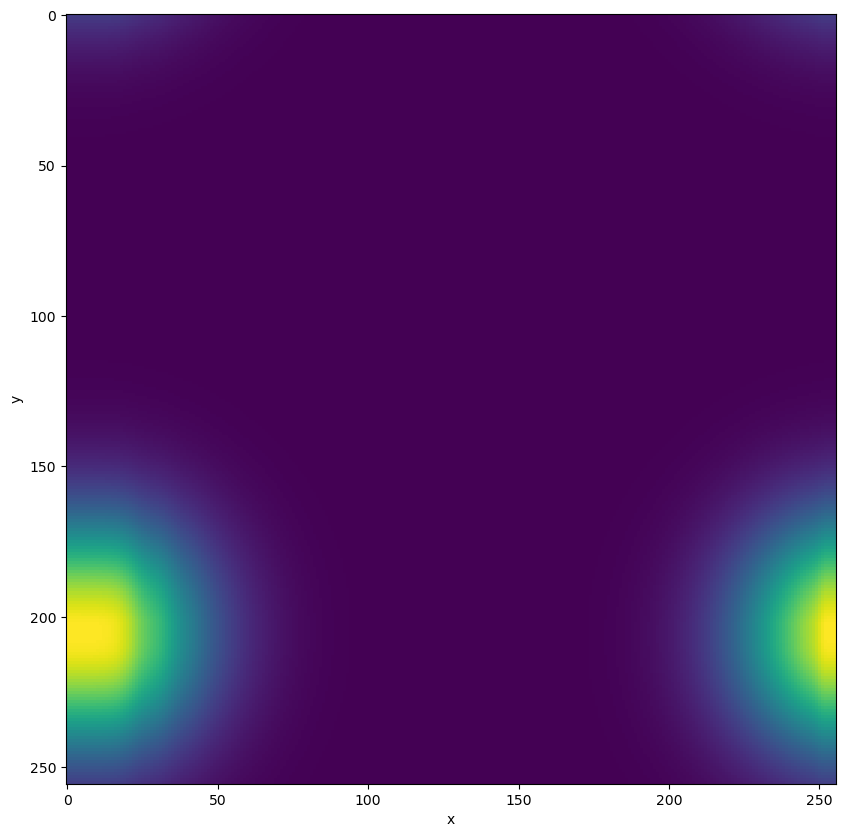

In [58]:
n  = 256
w = 2
A0 = 10
sigma = .3

vx = np.zeros((n,n)) + 1
vy = np.zeros((n,n)) + 5
v_field = np.concatenate((vx[None,], vy[None,]),axis=0)
exp = hd(velocity_field=v_field, n=n, Lbox=w)
exp.Bz = gauss(exp, amplitude=A0, sigma=sigma)

Cdt = 0.1
nt = 4000
solver = HLL
start = time()

dists = []
Ts = []
ims = []
T = 0
ani_frame = 20
fig = plt.figure(figsize=(10,10))
for it in range(nt):
    dt=exp.Courant(Cdt)
    exp = muscl_2d(exp,dt,Slope=MonCen, Riemann_Solver=solver)

    if it % ani_frame == 0:
        im = plt.imshow(exp.Bz, origin='upper',animated=True);
        plt.xlabel('x')
        plt.ylabel('y')
        ims.append([im])

used=time()-start
print('{:.1f} sec, {:.2f} microseconds/update'.format(used,1e6*used/(n**2*nt)))
anim = animation.ArtistAnimation(fig, ims, interval=50, blit=True,
                                repeat_delay=1000);

HTML(anim.to_jshtml())

------------
# Case 2 - ${\bf B} = B_x {\bf e}_x + B_y {\bf e}_y$ and ${\bf v} = v_x {\bf e}_x + v_y {\bf e}_y$ in a 2D sheet ($\partial_z = 0)$

- Asumptions: Consider a 2D velocity and magnetic fields such that ${\bf B} = B_x(x,y) {\bf e}_x + B_y(x,y) {\bf e}_y$ and ${\bf v} = v_x(x,y) {\bf e}_x + v_y(x,y) {\bf e}_y$. Assume the problem to be 2D, so $\partial_z = 0$. 


- Induction equation: Under the assumptions above, the induction equation reads better in terms of the vector potential ${\bf A}$ (such that ${\bf B} = \nabla \times {\bf A}$), which, because of the form of ${\bf B}$, only has component along the $z$ direction (i.e., ${\bf A} = A {\bf e}_z$). In this case, the induction equation reads

    \begin{align}
        \partial_t \left(\nabla \times {\bf A}\right) + \nabla \times \left[\left(\nabla \times {\bf A}\right) \times {\bf v}\right] &= 0 \nonumber \\
    \nabla \times \left[ \partial_t {\bf A} + \left(\nabla \times {\bf A}\right) \times {\bf v} \right] &= 0 \nonumber \\
    \nabla \times \left[ \left(\partial_t A + {\bf v}\cdot \nabla A\right) {\bf e}_z \right] &= 0 \nonumber 
    \end{align}

    The term in brackets is clearly the gradient of some scalar potential, i.e.:

    \begin{equation}
    \partial_t A + {\bf v}\cdot \nabla A = \partial_z \phi 
    \end{equation}
    However, since the problem is 2D, the R.H.S. is zero, implying

    \begin{equation}
    \frac{D A}{Dt} = \frac{\partial A}{\partial t} + {\bf v}\cdot \nabla A = 0\,.
    \end{equation}
    Thus, the vector potential is strictly conserved along the streamlines of the fluid.

    Once we solve the equation for the potential, the magnetic field is:

\begin{equation}
{\bf B} = \frac{\partial A}{\partial y} {\bf e}_x - \frac{\partial A}{\partial x} {\bf e}_y\,.
\end{equation}

- Solenoidal constraint: Since we solve for the scalar potential, the solenoidal property of the magnetic field is automatically satisfied.



### Simple discretization of the transport equation and numerical solution

The equation we want to solve is:

\begin{equation}
\partial_t A + {\bf v} \cdot \nabla A = 0\,.
\end{equation}

This equation is equivalent to:
\begin{equation}
\frac{DA}{Dt} = 0\,,
\end{equation}
i.e., A is conserved quantity along the flow lines.


The simplest thing is to use operator splitting + finite differences, and write:

\begin{align}
A^{n+1} - A^{n} = \frac{v_i \Delta t}{\Delta x} \left(A_{i+1/2}^{n+1/2} - A_{i-1/2}^{n+1/2} \right) = 0\,.
\end{align}

So, the crucial step is to determine good representations of $A_{i\pm1/2}^{n+1/2}$. For simplicity, we provide a very simple first-order upwind (diffusive) method, however, higher order methods can be implemented.

--------
### Task 2: Create a 2D mesh that will constitute the domain of the problem
You may use the code below, which constitutes a partial solution, as a starting point.

In [60]:
import numpy as np
import matplotlib.pyplot as plt
#Some customization
plt.rcParams['figure.figsize'] = (5, 5)
plt.rcParams['image.origin'] = 'lower'

In [61]:
class Mesh():
    """
    Class to store the domain of the problem
    """
    def __init__(self,xmin,xmax,ymin,ymax,nx,ny):
        
        # Parameters
        self.xmin = xmin
        self.xmax = xmax
        self.ymin = ymin
        self.ymax = ymax
        self.nx   = nx
        self.ny   = ny
        self.extent = [xmin,xmax,ymin,ymax] #Useful for imshow

        # The mesh is created here....
        x    = np.linspace(xmin, xmax, nx)
        y    = np.linspace(ymin, ymax, ny)
        self.dx   = (xmax - xmin) / (nx-1)
        self.dy   = (ymax - ymin) / (ny-1)
            
        #This is the 2D mesh
        self.x,self.y = np.meshgrid(x,y)

mesh = Mesh(-0.5,0.5,-0.5,0.5,200,200) #This is how we use the mesh class

-----------------
### Task 3: Initialize the external velocity field ${\bf v}$ on the mesh and plot it

The test problem suggested is to initialize a rotating region and magnetic lines parallel to the y-axis. This test is similar to the well-known (full MHD) rotor test.

The test consists in definining a rotating region centered at $x_0=y_0=0$, described by:

\begin{align}
v_x &= \left\{
\begin{array}{cl}
  -v_\theta\sin{\theta} & r \leq r_1 \\
  -f(r)v_\theta\sin{\theta} & r_1 < r < r_2 \\
  0 & r \geq r_2\\
\end{array}\right. \nonumber \\
v_y &= \left\{
\begin{array}{cl}
  v_\theta\cos{\theta} & r \leq r_1 \\
  f(r)v_\theta\cos{\theta} & r_1 < r < r_2 \\
  0 & r \geq r_2\\
\end{array}\right. \nonumber
\end{align}

with $r=\sqrt{x^2+y^2}$, $\tan{\theta} = y/x$, $v_{\theta} = \Omega_0 r$, and the smoothing function $f(r)=(r_2-r)/(r_2-r_1)$. $\Omega_0$ is the angular frequency of the rotating region.

#### Suggested parameters for the mesh:

$x_{\rm min} = -0.5$, $x_{\rm max} =  0.5$, 

$y_{\rm min} = -0.5$, $y_{\rm max} =  0.5$ 

$\Omega_0 = 1.0$ 

$r_1 = 0.3$, $r_2 = 1.1 r_1$

In [62]:
def velocity_field(mesh, r1, omega0):
    
    """
    Returns the velocity field
    """
    
    r2      = 1.1*r1 # Smoothing (10%)

    # Definitions
    r     = np.sqrt(mesh.x**2 + mesh.y**2)  # Radial distance
    theta = np.arctan2(mesh.y, mesh.x)      # Theta
    vphi  = omega0 * r                      # Azimuthal velocity
    f     = (r2 - r) / (r2 - r1)            # Smoothing function

    # Velocity arrays
    vx   = np.zeros(mesh.x.shape)
    vy   = np.zeros(mesh.x.shape)

    # Initialize the velocity field
    vx[r<r2] = - f[r<r2] * vphi[r<r2] * np.sin(theta)[r<r2]
    vy[r<r2] =   f[r<r2] * vphi[r<r2] * np.cos(theta)[r<r2]
    vx[r<r1] = - vphi[r<r1] * np.sin(theta)[r<r1]
    vy[r<r1] =   vphi[r<r1] * np.cos(theta)[r<r1]
    
    return vx, vy

# Parameters
omega_0 = 10.0   # Angular frequency of the spinning region
r1      = 0.3    # Radius of the spinning region

mesh = Mesh(-0.5,0.5,-0.5,0.5,200,200)
vx, vy = velocity_field(mesh,0.3,10.0)

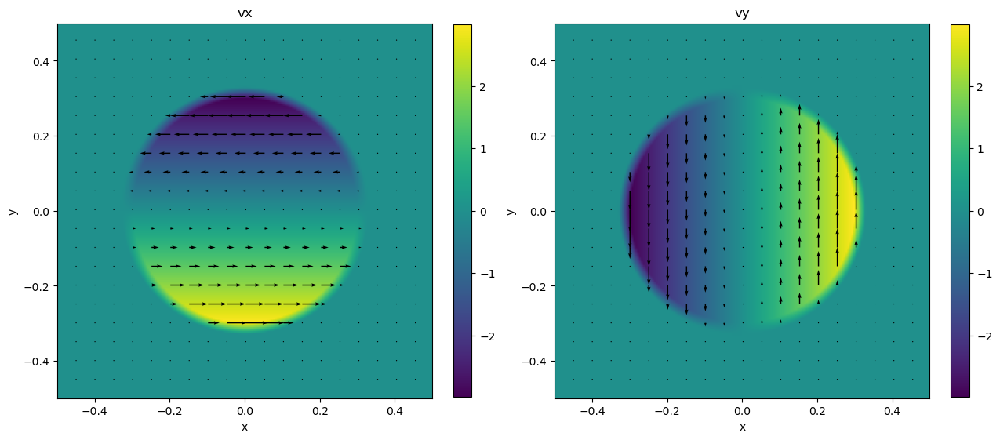

In [63]:
skip = 10

plt.figure(figsize=(15,10))

plt.subplot(1,2,1)
plt.quiver(mesh.x[::skip,::skip], mesh.y[::skip,::skip],vx[::skip,::skip],0, scale=50)
plt.imshow(vx,extent=mesh.extent)
plt.colorbar(fraction=0.045)
plt.xlabel('x')
plt.ylabel('y')
plt.title("vx")

plt.subplot(1,2,2)
plt.title("vy")
plt.imshow(vy, extent=mesh.extent)
plt.colorbar(fraction=0.045)
plt.quiver(mesh.x[::skip,::skip], mesh.y[::skip,::skip],0,vy[::skip,::skip], scale=50)
plt.xlabel('x')
plt.ylabel('y')

plt.show()

---------
### Task 4: 

#### 4a) Plot streamlines of the velocity field on top of each component of the velocity field (Tip: use streamplot() from matplotlib). 

#### 4b) Does the plot make sense? Explain what you observe.

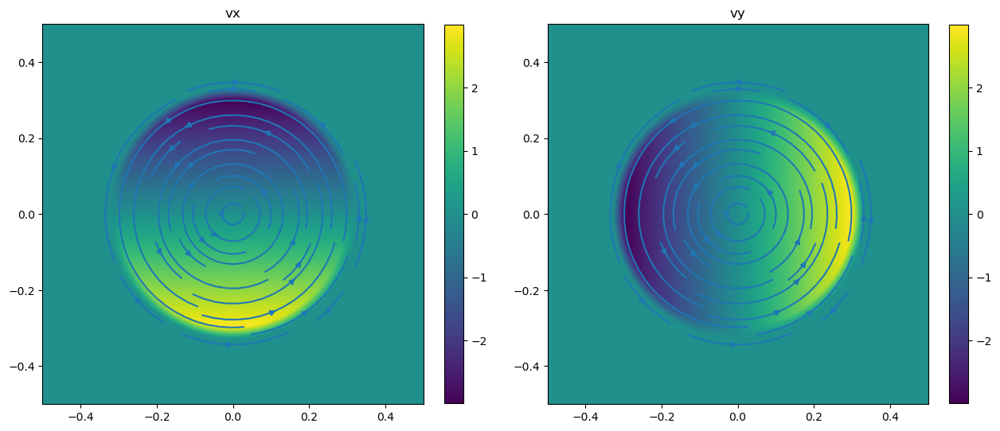

In [13]:
plt.figure(figsize=(15,10))

plt.subplot(1,2,1)
plt.title("vx")
plt.imshow(vx,extent=mesh.extent)
plt.colorbar(fraction=0.045)
plt.streamplot(mesh.x[::skip,::skip], mesh.y[::skip,::skip],vx[::skip,::skip],vy[::skip,::skip])

plt.subplot(1,2,2)
plt.title("vy")
plt.imshow(vy,extent=mesh.extent)
plt.colorbar(fraction=0.045)
plt.streamplot(mesh.x[::skip,::skip], mesh.y[::skip,::skip],vx[::skip,::skip],vy[::skip,::skip])

plt.show()

* The sign difference of of the colormap corresponds to the orientation and color of the streamlines, so it makes sense. Also the streamlines are close to zero at the "edge" of the disk, which is expected.

### Task 5: Initial magnetic field

#### 5a) Initialize a constant magnetic field parallel to the y-axis (i.e., $B_x = 0$) using the vector potential.

Help: Since, in the simple problem under consideration ${\bf B} = \partial_y A {\bf e}_x - \partial_x A {\bf e}_y$, if $B_x$ = 0, the potential vector does not depend on $y$. Furthermore, since $B_y$ is constant, the vector potential satisfies:

\begin{equation}
\partial_x A = c
\end{equation}

which implies that the potential vector is of the form:

\begin{equation}
 A(x) = cx + A_0
\end{equation}

#### Take $c=1$, $A_0=0$, and initialize the vector potential

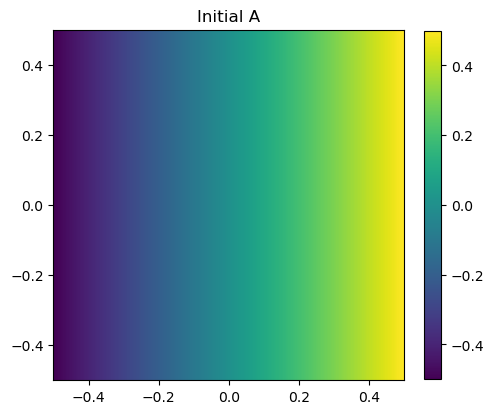

In [14]:
Ainit = mesh.x
plt.imshow(Ainit,extent=mesh.extent)
plt.colorbar(fraction=0.045)
plt.title('Initial A')
plt.show()

### Task 6: Magnetic lines

Magnetic lines can be plotted with the same function used to plot the streamlines of the velocity field (streamplot()), however, it requires obtaining ${\bf B}$ from $A_z$, which involves derivatives. In the simple problem under consideration, however, it is actually very simple to plot the magentic lines.

By definition, magnetic lines are tangent to the magnetic vector (similarly, streamlines are tangent to the velocity vector field).

Let's do the following calculation:

\begin{equation}
{\bf B} \cdot \nabla A_z = \left(\partial_y A_z {\bf e}_x - \partial_x A_z {\bf e}_y \right) \cdot \left( \partial_x A_z {\bf e}_x + \partial_y A_z {\bf e}_y\right) = \partial_y A_z \partial_x A_z -\partial_x A_z \partial_y A_z = 0
\end{equation}

It shows shows that ${\bf B}$ is perpendicular to $\nabla A_z$. Isocontours of $A_z$ are perpendincular to $\nabla A_z$, so they must be parallel to ${\bf B}$. We then conclude that isocontours of $A_z$ are magentic lines.

#### 6a) Compute the magnetic field from the vector potential and plot magnetic lines of the initial condition using streamplot().

#### 6b) Plot magnetic lines of the initial condition as isocontours of $A_z$.

#### 6c) Why does streamplot swap the sign of one magnetic line at the begining of the plot? Tip: Is the initial condition periodic in the X direction?

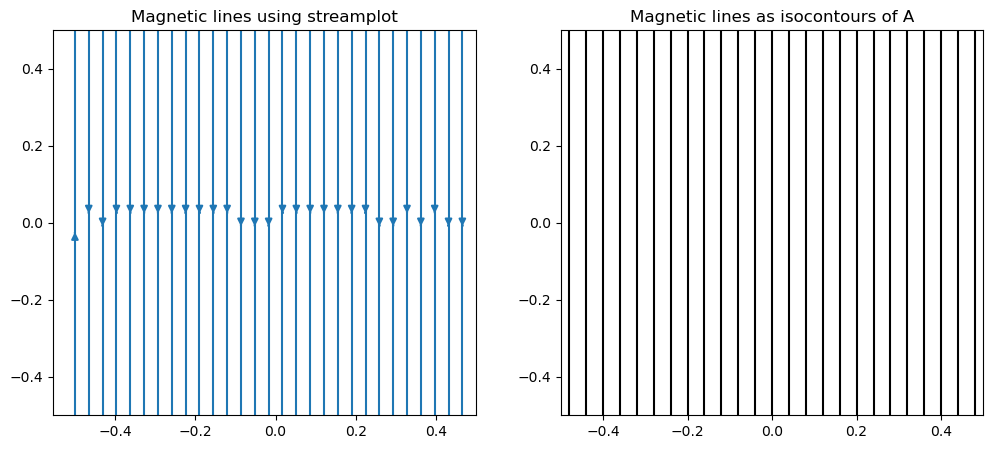

In [33]:
plt.figure(figsize=(12,5))

#We calculate the magnetic field from A (bx = d_y A, by = -d_x A)
bx =   (np.roll(Ainit,-1, axis=0) - np.roll(Ainit,1, axis=0)) / (2 * mesh.dy) 
by =  -(np.roll(Ainit,-1, axis=1) - np.roll(Ainit,1, axis=1)) / (2 * mesh.dx) 

plt.subplot(1,2,1)
plt.title("Magnetic lines using streamplot")
plt.streamplot(mesh.x, mesh.y,bx,by)

plt.subplot(1,2,2)
plt.title("Magnetic lines as isocontours of A")
plt.contour(mesh.x, mesh.y, Ainit,30, linestyles='solid', colors='k')

plt.show()


* The derivatives are calculated via a centered finite difference scheme

* The initial condition has a discontinuity at the boundary of the domain, which is not periodic. This is the reason why streamplot() swaps the sign of one magnetic line at the begining of the plot. The gradient is normally positive in x, because A is growing in the x direction but at the left boundary the gradient is negative because the value of A is smaller than the value of A at the right boundary. The signs of this is then switched when computing B.

### Task 7: Evolve the induction equation to find $A(t)$

In [16]:
class Transport():
    """
    This is the class we use to transport the vector potential
    """
    def advect(self,dt,axis):
        """
        1st order scheme "Donor cell"
        """
    
        if axis == 0:
            v = self.vy
            delta = self.mesh.dy

        if axis == 1:
            v = self.vx
            delta = self.mesh.dx
    
        pv = np.where(v>0)
        nv = np.where(v<=0)

        Am = np.roll(self.A, +1, axis=axis)
        Ap = np.roll(self.A, -1, axis=axis)

        self.A[pv] -= dt/delta*v[pv]*(self.A[pv]-Am[pv])
        self.A[nv] -= dt/delta*v[nv]*(Ap[nv]-self.A[nv])
    
    def __init__(self,mesh,vx,vy,A):

        #CFL condition
        self.dt = 0.5*np.sqrt(mesh.dx**2+mesh.dy**2)/np.max(np.sqrt(vx**2+vy**2))
        
        self.mesh = mesh
        self.vx = vx
        self.vy = vy
        self.A  = np.copy(A)
        
    def update(self,total_time):

        time = 0
        while(time < total_time):
        
            # We check we are beyond the requested output_time
            if time+self.dt > total_time:
                effective_dt = total_time-time
            else:
                effective_dt = self.dt
        
            # Simple operator split (first transport along X, then along Y)
            self.advect(effective_dt,axis=1)
            self.advect(effective_dt,axis=0)
            
            time += effective_dt

#### Example of use

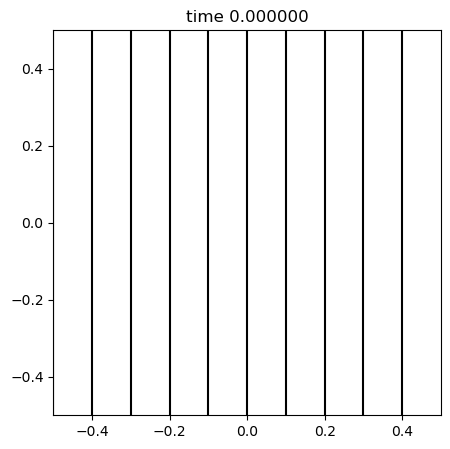

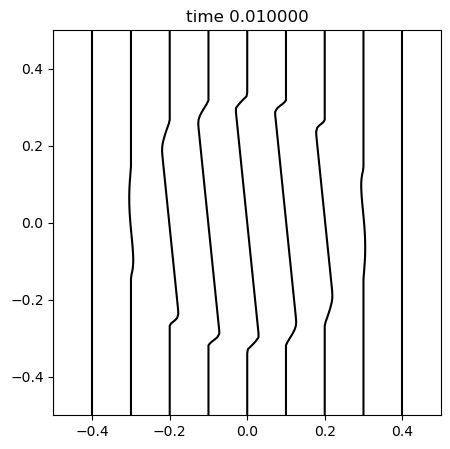

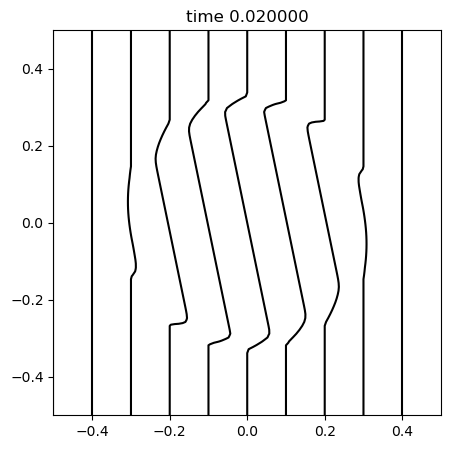

In [17]:
mesh  = Mesh(-0.5,0.5,-0.5,0.5,100,100)     # We create the mesh
vx,vy = velocity_field(mesh, 0.3, 10.0)     # We initialize a velocity field
A     = mesh.x                              # Initial condition for the vector potential

transport = Transport(mesh,vx,vy,A)         # Instantiate the Transport class

# Plot the initial condition
time = 0.0
plt.contour(transport.mesh.x,transport.mesh.y,transport.A,10,colors='k',linestyles='solid')
plt.title("time {:f}".format(time))
plt.show()

# Advance the induction equation
dt     = 0.01   # Integration step (Note that it is usually larger than the CFL condion)
nsteps = 2      # Number of Integration steps

for i in range(nsteps):
    transport.update(dt)
    
    # Plot the evolution of the magnetic lines
    time += dt
    plt.contour(transport.mesh.x,transport.mesh.y,transport.A,10,colors='k',linestyles='solid')
    plt.title("time {:f}".format(time))
    plt.show()

### Reconnection due to finite numerical resistivity

#### 7a) Use $\Omega_0 = 10$, $nx=ny=100$ and evolve $A$ by steps $\Delta t = 0.1$ until reaching a final time $t = 0.5$. For each step, plot the magentic line associated with the isocontours $A = 0$. 


    - What happens with the magnetic line? Is this what you expected from theoretical arguments?
    - Increase the number of grid-points to 400x400, what changes? Is this expected? Explain

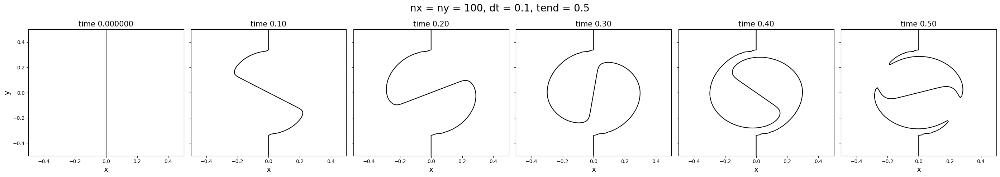

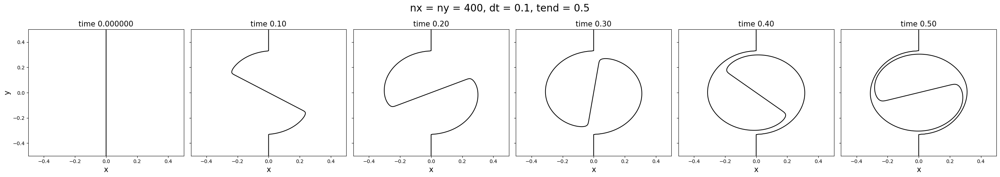

In [67]:
omg0 = 10
t_end = 0.5

for resolution in [100,400]:
    nx = ny = resolution

    mesh  = Mesh(-0.5,0.5,-0.5,0.5,nx,ny)       # We create the mesh
    vx,vy = velocity_field(mesh, 0.3, 10.0)     # We initialize a velocity field
    A     = mesh.x                              # Initial condition for the vector potential

    transport = Transport(mesh,vx,vy,A)         # Instantiate the Transport class

    # Advance the induction equation
    dt     = 0.1      # Integration step (Note that it is usually larger than the CFL condion)
    nsteps = 5        # Number of Integration steps

    # Plot the initial condition
    fig, ax = plt.subplots(nrows=1, ncols=6, figsize=(28,5), tight_layout=True, sharey=True)
    fig.suptitle(f'nx = ny = {nx}, dt = {dt}, tend = {t_end}', fontsize=20)
    ax = ax.flatten()
    time = 0.0

    ax[0].contour(transport.mesh.x,transport.mesh.y,transport.A,np.array([0]),colors='k',linestyles='solid')
    ax[0].set_title("time {:f}".format(time), fontsize=15)
    ax[0].set_xlabel('x', fontsize=15)
    ax[0].set_ylabel('y', fontsize=15)

    for i in range(nsteps):
        transport.update(dt)
        
        # Plot the evolution of the magnetic lines
        time += dt
        ax[i+1].contour(transport.mesh.x,transport.mesh.y,transport.A,np.array([0]),colors='k',linestyles='solid')
        ax[i+1].set_title("time {:.2f}".format(time), fontsize=15)
        ax[i+1].set_xlabel('x',fontsize=15)

    plt.show()

* The steady state solution to the rotor-problem is to have the magnetic field lines (isocontours of A) parallel to the velocity field. Without any sources this is only possible solution to this is the magnetic lines are 'flung out' and curled around the velocity field, which is exactly what we observe.

* As covered in the slides, solving this problem numerically introduces resistivity $\eta$ into the system. This resisivity is proportional to the distance between grid points. The resistivity is thus larger for the spatial resolution of $100$, than for $400$ case. The resistivity allows for 'breaking' of the field lines, which we observe at timestep $0.5$ for spatial res. $100$, but not for $400$.


### Field expulsion due to numerical resitivity

We will study the steady-state solution of the system.

#### 7b) Use $n_x=n_y=200$ to evolve $A$ for a time $t=20$ by steps $\Delta t = 5$.  For each $\Delta t$, plot 20 magnetic lines in the range A=(-0.5,0.5).
    
Note that in steady-state, our problem reads:
\begin{equation}
{\bf v}\cdot \nabla A_z = 0
\end{equation}
However, magnetic lines are isocontours of A:
\begin{equation}
{\bf B}\cdot \nabla A_z = 0
\end{equation}
so, in steady-state, ${\bf B}$ and ${\bf v}$ are parallel. Does the steady-state numerical solution show that?

#### 7c) For t=20, plot the streamlines on top of the magnetic lines. What happened with the magnetic field in the rotating region? Explain.

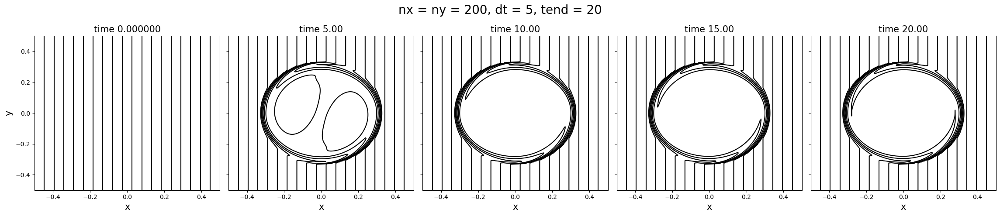

In [68]:
resolution = 200

nx = ny = resolution

mesh  = Mesh(-0.5,0.5,-0.5,0.5,nx,ny)       # We create the mesh
vx,vy = velocity_field(mesh, 0.3, 10.0)     # We initialize a velocity field
A     = mesh.x                              # Initial condition for the vector potential

transport = Transport(mesh,vx,vy,A)         # Instantiate the Transport class

# Advance the induction equation
dt     = 5      # Integration step (Note that it is usually larger than the CFL condion)
nsteps = 4      # Number of Integration steps
t_end = dt * nsteps

# Plot the initial condition
fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(23,5), tight_layout=True, sharey=True)
fig.suptitle(f'nx = ny = {nx}, dt = {dt}, tend = {t_end}', fontsize=20)
ax = ax.flatten()
time = 0.0

A_range =  np.linspace(-0.5,0.5, 20)

ax[0].contour(transport.mesh.x,transport.mesh.y,transport.A,A_range,colors='k',linestyles='solid')
ax[0].set_title("time {:f}".format(time), fontsize=15)
ax[0].set_xlabel('x', fontsize=15)
ax[0].set_ylabel('y', fontsize=15)      

for i in range(nsteps):
    transport.update(dt)
    
    # Plot the evolution of the magnetic lines
    time += dt
    ax[i+1].contour(transport.mesh.x,transport.mesh.y,transport.A,A_range,colors='k',linestyles='solid')
    ax[i+1].set_title("time {:.2f}".format(time), fontsize=15)
    ax[i+1].set_xlabel('x',fontsize=15)

* The figures above shows that the resistivity of the system has allowed for the field lines to diffuse out onto the edge. Out here the field lines seem to lie quite parallel the the velocity field.

This is due to the numerical steady state solution being

$$\boldsymbol{v} \cdot \nabla A  = \eta \nabla^2 A$$

Where $\eta$ is the resistivity, which is proportional to the distance between grid points. The numerical solution allows for the 'breaking' of field lines, meaning we can have a diffusion out onto the edge of the rotating velocity field.

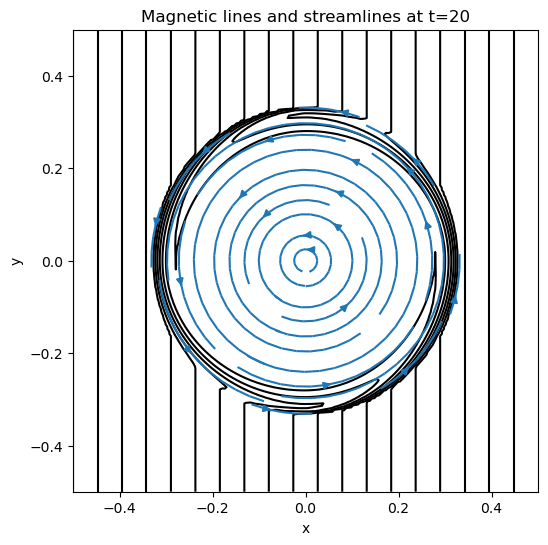

In [70]:
plt.figure(figsize=(6,6))
plt.contour(transport.mesh.x,transport.mesh.y,transport.A,A_range,colors='k',linestyles='solid')
plt.streamplot(transport.mesh.x, transport.mesh.y, transport.vx, transport.vy)
plt.title('Magnetic lines and streamlines at t=20')
plt.xlabel('x',fontsize=10)
plt.ylabel('y',fontsize=10)
plt.show()

* We observe that the magnetic lines have diffused out the edge of the rotating velocity field due to the numerical resistivity.

### __Absalon turn-in__

This exercise is a little bit different from past exercises by having a number of smaller tasks embedded in to the notebook. Once you have answered -- inline -- please remember to clean it up and copy your solution down beyond this cell. Upload your notebook together with a pdf of the notebook as a solution to the exercise

### Solution for case 1

#### Task 1

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from time import time
from IPython.display import HTML
from matplotlib import animation

# Empty class, used to create ad hoc objects
class empty_class(): pass

#We reuse a modifiied hd class from last weed
class hd():
    """ Template class for hydrodynamics, with parameters, variables and methods """
    def __init__(self,velocity_field, n=64 ,Lbox=2.):
        """ Initialization of arrays for conservative variables """
        self.n=n                        # number of points along a coordinate axis. n*n in total
        self.Lbox=Lbox                  # box size
        self.t = 0                      # time
        self.it = 0                     # iterations
        self.coordinates()              # setup cooridnate system
        self.velocity = velocity_field  # (2,n,n) array
        self.Bz = np.zeros((n,n))       # (n,n) array
    
    def coordinates(self):
        """ Coordinate initialization """
        n = self.n                      # shorthand, used a lot below
        self.ds = self.Lbox/n

        # cell-centered coordinates are in the interval [-Lbox/2+ds/2,...,Lbox/2-ds/2]
        self.x = np.linspace(-self.Lbox*0.5,self.Lbox*0.5,num=self.n,endpoint=False)+0.5*self.ds
        self.y = self.x
        xv, yv = np.meshgrid(self.x, self.y, sparse=True) # Coordinates as 2D arrays
        self.r = (xv**2 + yv**2)**0.5                     # make a 2D radius function for convenience
    
    def Courant(self,Cdt=0.5):
        """ Courant condition for HD """
        v = self.velocity
        speed = np.sqrt(v[0]**2 + v[1]**2)
        return Cdt*self.ds/np.max(speed)
    

#Re-using a modified hydro-flux function from last week
def Hydro_Flux(q):
    F = empty_class()
    F.Bz = q.Bz * q.vperp
    return F

#Re-using a modified HLL function from last week
def HLL(ql,qr):
    # maximum wave speeds to the left and right (guaranteed to have correct sign)
    SL = np.minimum(np.minimum(ql.vperp,qr.vperp),0) # <= 0.
    SR = np.maximum(np.maximum(ql.vperp,qr.vperp),0) # >= 0.

    # Hydro fluxes
    Fl = Hydro_Flux(ql)
    Fr = Hydro_Flux(qr)
    
    # HLL flux based on wavespeeds. If SL < 0 and SR > 0 then mix state appropriately
    Flux = empty_class()
    Flux.Bz = (SR*Fl.Bz - SL*Fr.Bz + SL*SR*(qr.Bz - ql.Bz)) / (SR - SL)
    return Flux

def muscl_2d (exp, dt, Slope=MonCen, Riemann_Solver=HLL):
    
    # Making shorthand variables
    ds   = exp.ds
    ids  = 1. / exp.ds
    dtds = dt/exp.ds

    # Copying as to not fuck anything up
    Bz = np.copy(exp.Bz)
    v  = exp.velocity.copy()

    # 2) Compute slope limited derivatives based on centered points
    dBz = Slope(Bz) * ids       # returns (2,n,n)
    dv0 = Slope(v[0]) * ids     # returns (2,n,n)
    dv1 = Slope(v[1]) * ids     # returns (2,n,n)
    dv  = np.array([dv0,dv1])   # shape = (2,2,n,n)

    # 3) Trace forward to find solution at [t+dt/2, x +- dx/2]
    # Time evolution with source terms
    div = dv[0,0] + dv[1,1]                               # div(v)
    Bz_t = - v[0] * Bz[0] - v[1] * Bz[1] - Bz*div
    
    # Loop over X- and Y-direction
    for axis in range(2):
        ql = empty_class()
        qr = empty_class()
        
        # Calculates the perpendicular and parallel velocities to the interface
        # X-axis: iperp=0, ipar=1, Y-axis: iperp=1, ipar=0
        iperp = axis
        
        # Perpendicular and parallel velocities
        vperp = v[iperp]

        # 4) Spatial interpolation "axis"-direction + time terms

        # left state -- AS SEEN FROM THE INTERFACE
        ql.Bz = Bz + 0.5*(dt*Bz_t + ds*dBz[axis])
        ql.vperp = vperp #+ 0.5*(ds*dvperp[axis])


        # right state -- AS SEEN FROM THE INTERFACE
        qr.Bz = Bz + 0.5*(dt*Bz_t - ds*dBz[axis])
        qr.vperp = vperp #- 0.5*(ds*dvperp[axis])

        # 5) Roll down -1 in the "axis" direction so that we collect
        qr.Bz = np.roll(qr.Bz,-1,axis=axis)
        qr.vperp = np.roll(qr.vperp,-1,axis=axis)

        # 6) Solve for flux based on interface values
        Flux = Riemann_Solver(ql,qr)

        # 7) Update conserved variables with fluxes
        exp.Bz  -= dtds * (Flux.Bz - np.roll(Flux.Bz,1,axis=axis))

    exp.t  += dt # update time
    exp.it += 1  # update number of iterations

    return exp

# To define initial Bz values
def gauss(exp, amplitude, sigma):
    # print(sigma)
    r = exp.r
    # print(np.exp(- ( r / sigma)**2 ))
    return amplitude * np.exp(- ( r / sigma)**2 )

n  = 256
w = 2
A0 = 10
sigma = .3

vx = np.zeros((n,n)) + 1
vy = np.zeros((n,n)) + 5
v_field = np.concatenate((vx[None,], vy[None,]),axis=0)
exp = hd(velocity_field=v_field, n=n, Lbox=w)
exp.Bz = gauss(exp, amplitude=A0, sigma=sigma)

Cdt = 0.1
nt = 4000
solver = HLL
start = time()

dists = []
Ts = []
ims = []
T = 0
ani_frame = 20
fig = plt.figure(figsize=(10,10))
for it in range(nt):
    dt=exp.Courant(Cdt)
    exp = muscl_2d(exp,dt,Slope=MonCen, Riemann_Solver=solver)

    if it % ani_frame == 0:
        im = plt.imshow(exp.Bz, origin='upper',animated=True);
        plt.xlabel('x')
        plt.ylabel('y')
        ims.append([im])

used=time()-start
print('{:.1f} sec, {:.2f} microseconds/update'.format(used,1e6*used/(n**2*nt)))
anim = animation.ArtistAnimation(fig, ims, interval=50, blit=True,
                                repeat_delay=1000);

HTML(anim.to_jshtml())

### Solutions for case 2

#### Task 2

In [71]:
class Mesh():
    """
    Class to store the domain of the problem
    """
    def __init__(self,xmin,xmax,ymin,ymax,nx,ny):
        
        # Parameters
        self.xmin = xmin
        self.xmax = xmax
        self.ymin = ymin
        self.ymax = ymax
        self.nx   = nx
        self.ny   = ny
        self.extent = [xmin,xmax,ymin,ymax] #Useful for imshow

        # The mesh is created here....
        x    = np.linspace(xmin, xmax, nx)
        y    = np.linspace(ymin, ymax, ny)
        self.dx   = (xmax - xmin) / (nx-1)
        self.dy   = (ymax - ymin) / (ny-1)
            
        #This is the 2D mesh
        self.x,self.y = np.meshgrid(x,y)

mesh = Mesh(-0.5,0.5,-0.5,0.5,200,200) #This is how we use the mesh class

#### Task 3

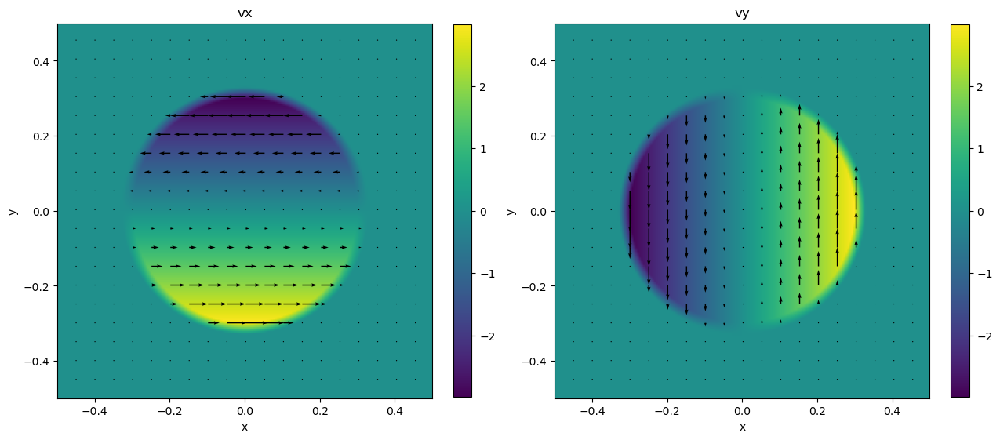

In [72]:
def velocity_field(mesh, r1, omega0):
    
    """
    Returns the velocity field
    """
    
    r2      = 1.1*r1 # Smoothing (10%)

    # Definitions
    r     = np.sqrt(mesh.x**2 + mesh.y**2)  # Radial distance
    theta = np.arctan2(mesh.y, mesh.x)      # Theta
    vphi  = omega0 * r                      # Azimuthal velocity
    f     = (r2 - r) / (r2 - r1)            # Smoothing function

    # Velocity arrays
    vx   = np.zeros(mesh.x.shape)
    vy   = np.zeros(mesh.x.shape)

    # Initialize the velocity field
    vx[r<r2] = - f[r<r2] * vphi[r<r2] * np.sin(theta)[r<r2]
    vy[r<r2] =   f[r<r2] * vphi[r<r2] * np.cos(theta)[r<r2]
    vx[r<r1] = - vphi[r<r1] * np.sin(theta)[r<r1]
    vy[r<r1] =   vphi[r<r1] * np.cos(theta)[r<r1]
    
    return vx, vy

# Parameters
omega_0 = 10.0   # Angular frequency of the spinning region
r1      = 0.3    # Radius of the spinning region

mesh = Mesh(-0.5,0.5,-0.5,0.5,200,200)
vx, vy = velocity_field(mesh,0.3,10.0)

skip = 10

plt.figure(figsize=(15,10))

plt.subplot(1,2,1)
plt.quiver(mesh.x[::skip,::skip], mesh.y[::skip,::skip],vx[::skip,::skip],0, scale=50)
plt.imshow(vx,extent=mesh.extent)
plt.colorbar(fraction=0.045)
plt.xlabel('x')
plt.ylabel('y')
plt.title("vx")

plt.subplot(1,2,2)
plt.title("vy")
plt.imshow(vy, extent=mesh.extent)
plt.colorbar(fraction=0.045)
plt.quiver(mesh.x[::skip,::skip], mesh.y[::skip,::skip],0,vy[::skip,::skip], scale=50)
plt.xlabel('x')
plt.ylabel('y')

plt.show()

#### Task 4

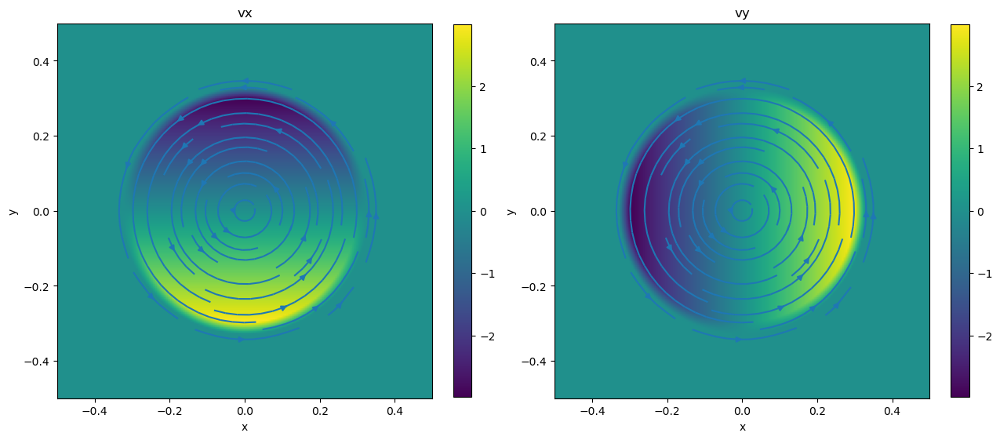

In [76]:
plt.figure(figsize=(15,10))

plt.subplot(1,2,1)
plt.title("vx")
plt.imshow(vx,extent=mesh.extent)
plt.colorbar(fraction=0.045)
plt.streamplot(mesh.x[::skip,::skip], mesh.y[::skip,::skip],vx[::skip,::skip],vy[::skip,::skip])
plt.xlabel('x')
plt.ylabel('y')

plt.subplot(1,2,2)
plt.title("vy")
plt.imshow(vy,extent=mesh.extent)
plt.colorbar(fraction=0.045)
plt.streamplot(mesh.x[::skip,::skip], mesh.y[::skip,::skip],vx[::skip,::skip],vy[::skip,::skip])
plt.xlabel('x')
plt.ylabel('y')

plt.show()

* The sign difference of of the colormap corresponds to the orientation and color of the streamlines, so it makes sense. Also the streamlines are close to zero at the "edge" of the disk, which is expected.

#### Task 5

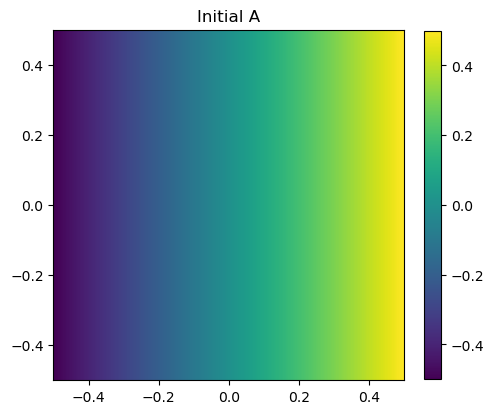

In [74]:
Ainit = mesh.x
plt.imshow(Ainit,extent=mesh.extent)
plt.colorbar(fraction=0.045)
plt.title('Initial A')
plt.show()

#### Task 6

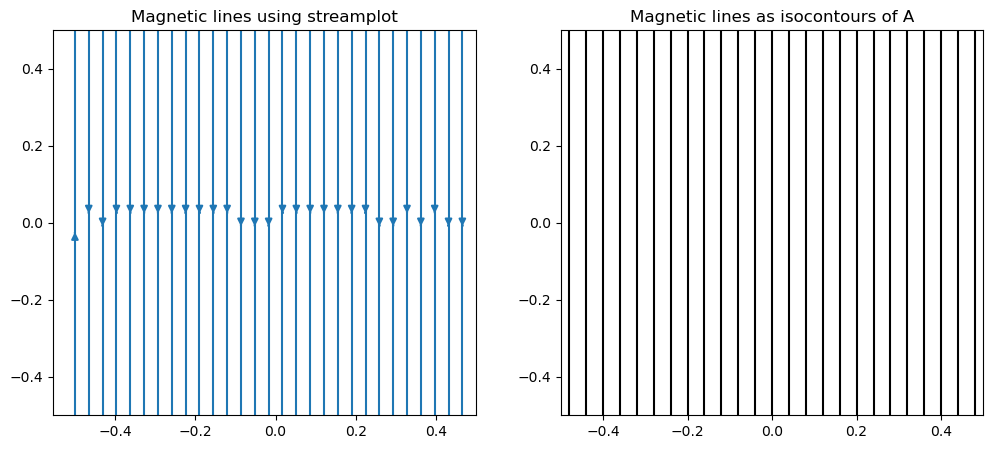

In [75]:
plt.figure(figsize=(12,5))

#We calculate the magnetic field from A (bx = d_y A, by = -d_x A)
bx =   (np.roll(Ainit,-1, axis=0) - np.roll(Ainit,1, axis=0)) / (2 * mesh.dy) 
by =  -(np.roll(Ainit,-1, axis=1) - np.roll(Ainit,1, axis=1)) / (2 * mesh.dx) 

plt.subplot(1,2,1)
plt.title("Magnetic lines using streamplot")
plt.streamplot(mesh.x, mesh.y,bx,by)

plt.subplot(1,2,2)
plt.title("Magnetic lines as isocontours of A")
plt.contour(mesh.x, mesh.y, Ainit,30, linestyles='solid', colors='k')

plt.show()

* The derivatives are calculated via a centered finite difference scheme

* The initial condition has a discontinuity at the boundary of the domain, which is not periodic. This is the reason why streamplot() swaps the sign of one magnetic line at the begining of the plot. The gradient is normally positive in x, because A is growing in the x direction but at the left boundary the gradient is negative because the value of A is smaller than the value of A at the right boundary. The signs of this is then switched when computing B.

#### Task 7

##### 7a

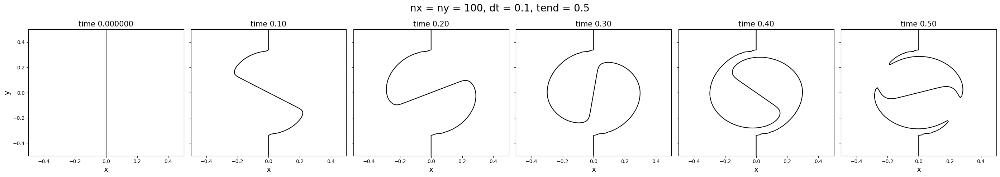

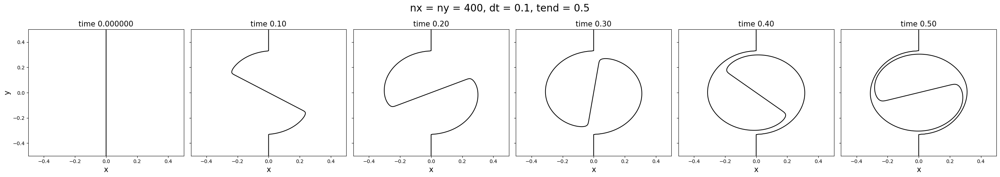

In [77]:
omg0 = 10
t_end = 0.5

for resolution in [100,400]:
    nx = ny = resolution

    mesh  = Mesh(-0.5,0.5,-0.5,0.5,nx,ny)       # We create the mesh
    vx,vy = velocity_field(mesh, 0.3, 10.0)     # We initialize a velocity field
    A     = mesh.x                              # Initial condition for the vector potential

    transport = Transport(mesh,vx,vy,A)         # Instantiate the Transport class

    # Advance the induction equation
    dt     = 0.1      # Integration step (Note that it is usually larger than the CFL condion)
    nsteps = 5        # Number of Integration steps

    # Plot the initial condition
    fig, ax = plt.subplots(nrows=1, ncols=6, figsize=(28,5), tight_layout=True, sharey=True)
    fig.suptitle(f'nx = ny = {nx}, dt = {dt}, tend = {t_end}', fontsize=20)
    ax = ax.flatten()
    time = 0.0

    ax[0].contour(transport.mesh.x,transport.mesh.y,transport.A,np.array([0]),colors='k',linestyles='solid')
    ax[0].set_title("time {:f}".format(time), fontsize=15)
    ax[0].set_xlabel('x', fontsize=15)
    ax[0].set_ylabel('y', fontsize=15)

    for i in range(nsteps):
        transport.update(dt)
        
        # Plot the evolution of the magnetic lines
        time += dt
        ax[i+1].contour(transport.mesh.x,transport.mesh.y,transport.A,np.array([0]),colors='k',linestyles='solid')
        ax[i+1].set_title("time {:.2f}".format(time), fontsize=15)
        ax[i+1].set_xlabel('x',fontsize=15)

    plt.show()

* The steady state solution to the rotor-problem is to have the magnetic field lines (isocontours of A) parallel to the velocity field. Without any sources this is only possible solution to this is the magnetic lines are 'flung out' and curled around the velocity field, which is exactly what we observe.

* As covered in the slides, solving this problem numerically introduces resistivity $\eta$ into the system. This resisivity is proportional to the distance between grid points. The resistivity is thus larger for the spatial resolution of $100$, than for $400$ case. The resistivity allows for 'breaking' of the field lines, which we observe at timestep $0.5$ for spatial res. $100$, but not for $400$.

##### 7b

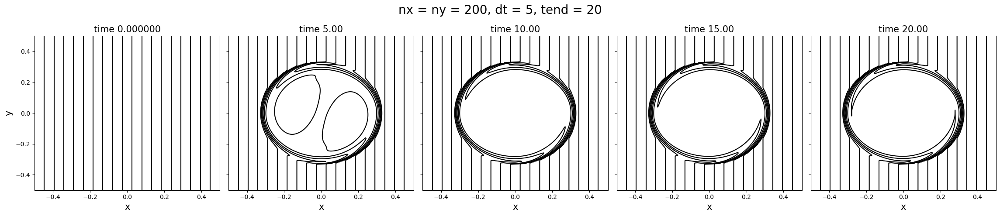

In [78]:
resolution = 200

nx = ny = resolution

mesh  = Mesh(-0.5,0.5,-0.5,0.5,nx,ny)       # We create the mesh
vx,vy = velocity_field(mesh, 0.3, 10.0)     # We initialize a velocity field
A     = mesh.x                              # Initial condition for the vector potential

transport = Transport(mesh,vx,vy,A)         # Instantiate the Transport class

# Advance the induction equation
dt     = 5      # Integration step (Note that it is usually larger than the CFL condion)
nsteps = 4      # Number of Integration steps
t_end = dt * nsteps

# Plot the initial condition
fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(23,5), tight_layout=True, sharey=True)
fig.suptitle(f'nx = ny = {nx}, dt = {dt}, tend = {t_end}', fontsize=20)
ax = ax.flatten()
time = 0.0

A_range =  np.linspace(-0.5,0.5, 20)

ax[0].contour(transport.mesh.x,transport.mesh.y,transport.A,A_range,colors='k',linestyles='solid')
ax[0].set_title("time {:f}".format(time), fontsize=15)
ax[0].set_xlabel('x', fontsize=15)
ax[0].set_ylabel('y', fontsize=15)      

for i in range(nsteps):
    transport.update(dt)
    
    # Plot the evolution of the magnetic lines
    time += dt
    ax[i+1].contour(transport.mesh.x,transport.mesh.y,transport.A,A_range,colors='k',linestyles='solid')
    ax[i+1].set_title("time {:.2f}".format(time), fontsize=15)
    ax[i+1].set_xlabel('x',fontsize=15)

* The figures above shows that the resistivity of the system has allowed for the field lines to diffuse out onto the edge. Out here the field lines seem to lie quite parallel the the velocity field.

This is due to the numerical steady state solution being

$$\boldsymbol{v} \cdot \nabla A  = \eta \nabla^2 A$$

Where $\eta$ is the resistivity, which is proportional to the distance between grid points. The numerical solution allows for the 'breaking' of field lines, meaning we can have a diffusion out onto the edge of the rotating velocity field.

##### 7c

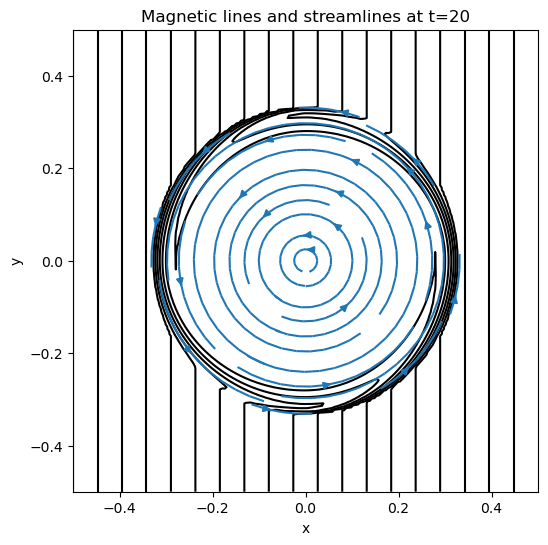

In [79]:
plt.figure(figsize=(6,6))
plt.contour(transport.mesh.x,transport.mesh.y,transport.A,A_range,colors='k',linestyles='solid')
plt.streamplot(transport.mesh.x, transport.mesh.y, transport.vx, transport.vy)
plt.title('Magnetic lines and streamlines at t=20')
plt.xlabel('x',fontsize=10)
plt.ylabel('y',fontsize=10)
plt.show()

* We observe that the magnetic lines have diffused out the edge of the rotating velocity field due to the numerical resistivity.